# ITC Client Churn

# 1.Analyze the data, clean the data, transform if needed. Provide a few key visuals. 

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
from collections import defaultdict
from sklearn.preprocessing import LabelEncoder
import joypy
import plotly.express as px 
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score,roc_auc_score,roc_curve
from xgboost import XGBClassifier 
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import shap
df = pd.read_excel('Task.xlsx')
df.head()

,customerID,gender,SeniorCitizen,US State,Duration,Phone Code,Telephone Number,Product: International,Product: Voice mail,vmail,...,eve EUR,night minutes,night calls,night EUR,international minutes,international calls,internatonal EUR,service calls,PaperlessBilling,churn
0,7590-VHVEG,Female,0,KS,128,415,382-4657,no,yes,25,...,16.78,244.7,91,11.01,10.0,3,2.70,1,Yes,False
1,5575-GNVDE,Male,0,OH,107,415,371-7191,no,yes,26,...,16.62,254.4,103,11.45,13.7,3,3.70,1,No,False
2,3668-QPYBK,Male,0,NJ,137,415,358-1921,no,no,0,...,10.30,162.6,104,7.32,12.2,5,3.29,0,Yes,False
3,7795-CFOCW,Male,0,OH,84,408,375-9999,yes,no,0,...,5.26,196.9,89,8.86,6.6,7,1.78,2,No,False
4,9237-HQITU,Female,0,OK,75,415,330-6626,yes,no,0,...,12.61,186.9,121,8.41,10.1,3,2.73,3,Yes,False


In [2]:
# the summary of a DataFrame which includes column dtypes, non-null
# we notice that we have no NULL values in the datafrome which save one step in preprocessing
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customerID              3333 non-null   object 
 1   gender                  3333 non-null   object 
 2   SeniorCitizen           3333 non-null   int64  
 3   US State                3333 non-null   object 
 4   Duration                3333 non-null   int64  
 5   Phone Code              3333 non-null   int64  
 6   Telephone Number        3333 non-null   object 
 7   Product: International  3333 non-null   object 
 8   Product: Voice mail     3333 non-null   object 
 9   vmail                   3333 non-null   int64  
 10  Call day minutes        3333 non-null   float64
 11  total day calls         3333 non-null   int64  
 12  Total, EUR              3333 non-null   float64
 13  eve minutes             3333 non-null   float64
 14  eve calls               3333 non-null   

In [3]:
# Analyzes the statistical summaries of the numerical columns
df.describe()

,SeniorCitizen,Duration,Phone Code,vmail,Call day minutes,total day calls,"Total, EUR",eve minutes,eve calls,eve EUR,night minutes,night calls,night EUR,international minutes,international calls,internatonal EUR,service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,0.157516,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,0.364341,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,0.000000,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,0.000000,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,0.000000,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,1.000000,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [4]:
# here we can see the number of unique values for each feature 
# we notice that 27 Telephone Numbers are not unique, this will be ignored as the number is very small

df.astype('object').describe().transpose()

,count,unique,top,freq
customerID,3333,3333,7590-VHVEG,1
gender,3333,2,Male,1705
SeniorCitizen,3333,2,0,2808
US State,3333,51,WV,106
Duration,3333,212,105,43
Phone Code,3333,3,415,1655
Telephone Number,3333,3306,396-8265,4
Product: International,3333,2,no,3010
Product: Voice mail,3333,2,no,2411
vmail,3333,46,0,2411


In [5]:
# we notice that number of users with no churn is very much higher than the ones with churn
# 85% of users didn't churn in the dataset and only 15% churned 
df["churn"].value_counts()

False    2850
True      483
Name: churn, dtype: int64

In [6]:

#Defining bar chart function
def bar(feature, df=df ):
    #Groupby the categorical feature
    temp_df = df.groupby([feature, 'churn']).size().reset_index()
    temp_df = temp_df.rename(columns={0:'Count'})
    #Calculate the value counts of each distribution and it's corresponding Percentages
    value_counts_df = df[feature].value_counts().to_frame().reset_index()
    categories = [cat[1][0] for cat in value_counts_df.iterrows()]
    #Calculate the value counts of each distribution and it's corresponding Percentages
    num_list = [num[1][1] for num in value_counts_df.iterrows()]
    div_list = [element / sum(num_list) for element in num_list]
    percentage = [round(element * 100,1) for element in div_list]
    #Defining string formatting for graph annotation
    #Numeric section
    def num_format(list_instance):
        formatted_str = ''
        for index,num in enumerate(list_instance):
            if index < len(list_instance)-2:
                formatted_str=formatted_str+f'{num}%, ' #append to empty string(formatted_str)
            elif index == len(list_instance)-2:
                formatted_str=formatted_str+f'{num}% & '
            else:
                formatted_str=formatted_str+f'{num}%'
        return formatted_str
    #Categorical section
    def str_format(list_instance):
        formatted_str = ''
        for index, cat in enumerate(list_instance):
            if index < len(list_instance)-2:
                formatted_str=formatted_str+f'{cat}, '
            elif index == len(list_instance)-2:
                formatted_str=formatted_str+f'{cat} & '
            else:
                formatted_str=formatted_str+f'{cat}'
        return formatted_str


    #Running the formatting functions
    num_str = num_format(percentage)
    cat_str = str_format(categories)
    
    #Setting graph framework
    fig = px.bar(temp_df, x=feature, y='Count', color='churn', title=f'Churn rate by {feature}', barmode="group", color_discrete_sequence=["blue", "red"])
    fig.add_annotation(
                text=f'Value count of distribution of {cat_str} are<br>{num_str} percentage respectively.',
                align='left',
                showarrow=False,
                xref='paper',
                yref='paper',
                x=1.4,
                y=1.3,
                bordercolor='black',
                borderwidth=1)
    fig.update_layout(
        # margin space for the annotations on the right
        margin=dict(r=400),
    )
     
    return fig.show()

# Defining the histogram plotting function
def hist(feature):
    group_df = df.groupby([feature, 'churn']).size().reset_index()
    group_df = group_df.rename(columns={0: 'Count'})
    fig = px.histogram(group_df, x=feature, y='Count', color='churn', marginal='box', title=f'Churn rate frequency to {feature} distribution', color_discrete_sequence=["blue", "red"])
    fig.show()

In [7]:
# converting categorical features to numerical
df.loc[df.PaperlessBilling=='No','PaperlessBilling'] = 0
df.loc[df.PaperlessBilling=='Yes','PaperlessBilling'] = 1

df.loc[df.SeniorCitizen==0,'SeniorCitizen'] =0 
df.loc[df.SeniorCitizen==1,'SeniorCitizen'] =1 

df.loc[df.gender=='Male','gender'] = 0
df.loc[df.gender=='Female','gender'] = 1

df.loc[df['Product: International']=='no','Product: International'] = 0
df.loc[df['Product: International']=='yes','Product: International'] = 1

df.loc[df['Product: Voice mail']=='no','Product: Voice mail'] = 0
df.loc[df['Product: Voice mail']=='yes','Product: Voice mail'] = 1

In [8]:
#printing the distribution for categorical features 

# we notice that mostly the gender had a very small effect on churn which is supported by the correlation
bar('gender')
# we also notice that SeniorCitizen has less effect on churn  which is supported by the correlation
bar('SeniorCitizen')
# it seems that Product International has a great effect on churn  which is supported by the correlation
bar('Product: International')
bar('Product: Voice mail')
# PaperlessBilling seems to have less effect on churn  which is supported by the correlation
bar('PaperlessBilling')
bar('US State')
bar('Phone Code')

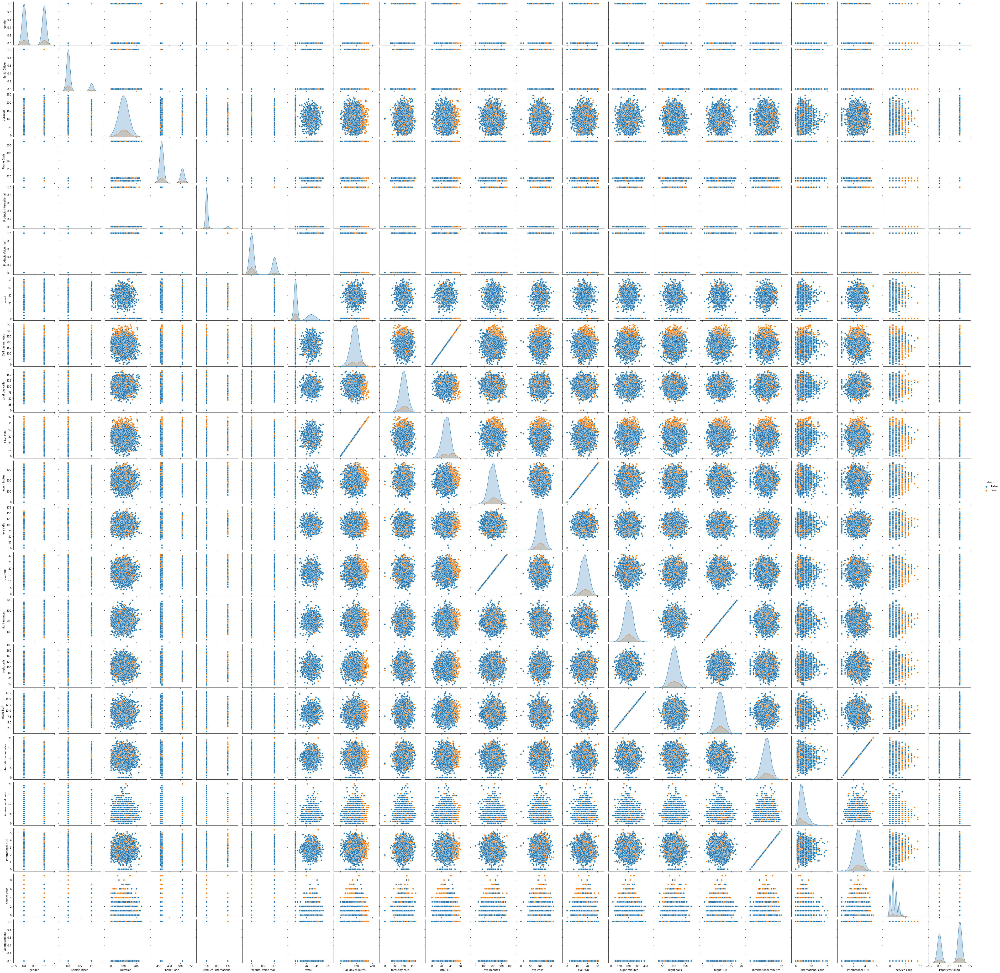

In [9]:
# Bivariate analysis: looks at how two variables relate to each other in terms of churn
# Numerical-numerical variables
sns.pairplot(data = df, hue='churn')
plt.show()

In [10]:
# most of the numerical features are normally distributed except vmail, international calls, service calls
# since we're using algorithms based on decision trees, it means that you don't have to worry about "non-normality" completely.

hist('Duration')
hist('vmail')
hist('Call day minutes')
hist('total day calls')
hist('Total, EUR')
hist('eve minutes')
hist('eve calls')
hist('eve EUR')
hist('night minutes')
hist('night calls')
hist('night EUR')
hist('international minutes')
hist('international calls')
hist('internatonal EUR')
hist('service calls')


# 2. Prepare a graph that shows the distribution of total number of minutes for international calls geographically in breakdown 

In [11]:
# extracting the features needed for the task
df_dis_calls=df[['international minutes','eve calls','total day calls','US State']]
df_dis_calls

,international minutes,eve calls,total day calls,US State
0,10.0,99,110,KS
1,13.7,103,123,OH
2,12.2,110,114,NJ
3,6.6,88,71,OH
4,10.1,122,113,OK
...,...,...,...,...
3328,9.9,126,77,AZ
3329,9.6,55,57,WV
3330,14.1,58,109,RI
3331,5.0,84,105,CT


C:\Users\ElHarameinSamyJaby\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\ElHarameinSamyJaby\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\ElHarameinSamyJaby\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

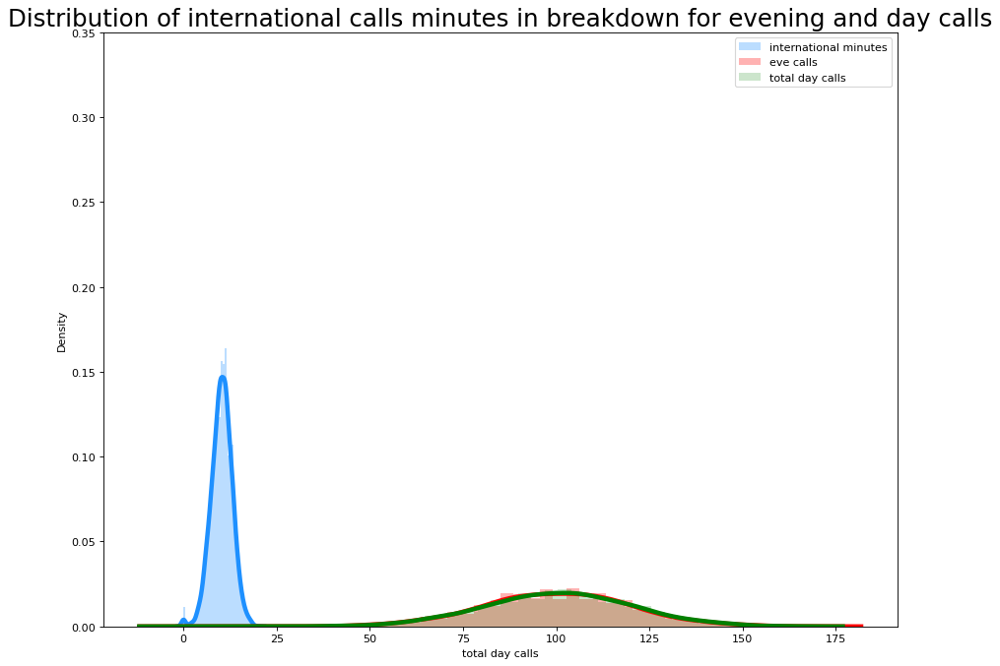

In [12]:
# generating the plot with no geographical feature
plt.figure(figsize=(13,10), dpi= 80)
sns.distplot(df_dis_calls['international minutes'], color="dodgerblue", label="international minutes", hist_kws={'alpha':.3}, kde_kws={'linewidth':4})
sns.distplot(df_dis_calls['eve calls'], color="red", label="eve calls", hist_kws={'alpha':.3}, kde_kws={'linewidth':4})
sns.distplot(df_dis_calls['total day calls'], color="g", label="total day calls", hist_kws={'alpha':.2}, kde_kws={'linewidth':4})
plt.ylim(0, 0.35)

# Decoration
plt.title('Distribution of international calls minutes in breakdown for evening and day calls', fontsize=22)
plt.legend()
plt.show()

<Figure size 160000x200000 with 0 Axes>

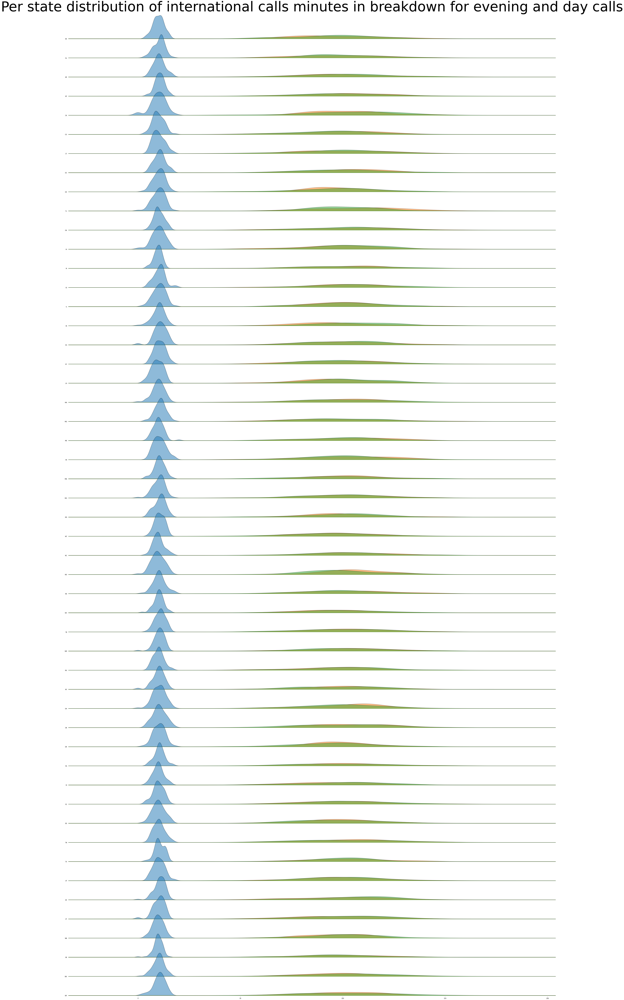

In [13]:
# generating the plot with geographical feature for each state
# Draw Plot
plt.figure(figsize=(80,100), dpi= 2000)
fig, axes = joypy.joyplot(df_dis_calls, column=['international minutes','eve calls','total day calls'], by='US State', ylim='own', figsize=(50,100), alpha=0.5)

# Decoration
#plt.rc("font", size=50)
plt.title('Per state distribution of international calls minutes in breakdown for evening and day calls', fontsize=100)
plt.xlabel('State', fontsize=120,  color='grey')

plt.show()

# 3. Make your assumptions on the relevant features for churn prediction. What extra features would you like to have, as you believe, they are crucial to explain churn. 

In [14]:
# some of the assumptions are already made in step 1

# as seen in the following correlation chart, the most correlated features with churn are the following:
# Product: International
# service calls
# service calls rate
# Total, EUR
# Call day minutes
# Total, EUR rate
# Call day minutes rate
# churn rate

# Most relevant features for churn are usually users engagement with the product and services
# Missing features include product characteristics, for example product type, product price, contract minimum term length,  number of parallel contracts.

# Service related like broadband speed, network coverage
# User type: Private or business, new user flag.


# 4. Generate new features that are relevant to explain churn. For example: number of call per day for a particular person as compared to number of calls for a comparable sample (i.e. for the same state).

In [15]:
#calculate features by state
df_bystate=df.groupby(['US State'])['total day calls','night calls','international calls','Duration','Total, EUR','service calls','Call day minutes', 'night minutes'].mean().reset_index()
#calculate churn rate by state
df_bystate_churn=df.groupby(['US State']).agg({'churn':'sum', 
                         'customerID':'nunique'}).reset_index()
df_bystate_churn['churn']=df_bystate_churn['churn']/df_bystate_churn['customerID']
del df_bystate_churn['customerID']
df_bystate=pd.merge(df_bystate,
                 df_bystate_churn,
                 on='US State', 
                 how='outer')
df_bystate.rename(columns={'total day calls':'total day calls rate', 'night calls':'night calls rate','international calls':'international calls rate','Duration':'Duration rate','Total, EUR':'Total, EUR rate','service calls':'service calls rate','Call day minutes':'Call day minutes rate','night minutes':'night minutes rate', 'churn':'churn rate'}, inplace=True)
df_bystate

C:\Users\ElHarameinSamyJaby\AppData\Local\Temp\ipykernel_19160\2159489575.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,US State,total day calls rate,night calls rate,international calls rate,Duration rate,"Total, EUR rate",service calls rate,Call day minutes rate,night minutes rate,churn rate
0,AK,95.269231,97.346154,4.807692,97.192308,30.325769,1.557692,178.384615,192.326923,0.057692
1,AL,99.100000,98.612500,4.700000,98.025000,31.621500,1.562500,186.010000,187.285000,0.100000
2,AR,102.145455,99.054545,4.690909,96.981818,29.940000,1.981818,176.116364,205.454545,0.200000
3,AZ,100.109375,99.984375,4.859375,100.468750,29.173125,1.593750,171.604688,194.004687,0.062500
4,CA,104.500000,99.205882,4.441176,99.235294,31.206176,1.470588,183.564706,198.508824,0.264706
5,CO,95.121212,97.060606,4.106061,102.545455,30.381818,1.787879,178.712121,189.898485,0.136364
6,CT,98.432432,102.283784,4.108108,99.040541,29.774324,1.513514,175.140541,205.997297,0.162162
7,DC,100.166667,97.666667,3.907407,105.722222,29.135370,1.351852,171.379630,206.348148,0.092593
8,DE,98.639344,101.213115,4.295082,101.918033,29.680164,1.622951,174.583607,203.900000,0.147541
9,FL,101.000000,100.333333,3.984127,109.571429,30.521429,1.571429,179.533333,196.147619,0.126984


In [16]:
df=pd.merge(df, df_bystate, on='US State', how='outer')
#calculating rates from deviding each feature with same feature per state rate
df['total day calls rate']=df['total day calls']/df['total day calls rate']
df['night calls rate']=df['night calls']/df['night calls rate']
df['international calls rate']=df['international calls']/df['international calls rate']
df['Duration rate']=df['Duration']/df['Duration rate']
df['Total, EUR rate']=df['Total, EUR']/df['Total, EUR rate']
df['service calls rate']=df['service calls']/df['service calls rate']
df['Call day minutes rate']=df['Call day minutes']/df['Call day minutes rate']
df['night minutes rate']=df['night minutes']/df['night minutes rate']
# generate new feature with area code from Telephone Number
df['AreaCode'] = df['Telephone Number'].str[:3]
df

,customerID,gender,SeniorCitizen,US State,Duration,Phone Code,Telephone Number,Product: International,Product: Voice mail,vmail,...,total day calls rate,night calls rate,international calls rate,Duration rate,"Total, EUR rate",service calls rate,Call day minutes rate,night minutes rate,churn rate,AreaCode
0,7590-VHVEG,1,0,KS,128,415,382-4657,0,1,25,...,1.088801,0.918927,0.666667,1.198662,1.383995,0.721649,1.383932,1.199686,0.185714,382
1,3712-PKXZA,0,0,KS,70,408,411-4582,0,0,0,...,1.207579,1.130987,0.000000,0.655518,1.211725,2.164948,1.211658,0.986420,0.185714,411
2,4959-JOSRX,1,0,KS,92,408,386-4170,1,0,0,...,1.098699,0.807848,0.444444,0.861538,0.326730,0.721649,0.326798,1.086925,0.185714,386
3,5583-SXDAG,0,0,KS,137,408,352-8202,0,0,0,...,0.871041,0.848240,0.888889,1.282943,1.074769,1.443299,1.074883,1.421287,0.185714,352
4,9571-EDEBV,0,0,KS,132,415,369-3214,0,0,0,...,1.088801,1.151183,1.111111,1.236120,0.435435,0.721649,0.435382,0.719223,0.185714,369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,5762-TJXGK,1,0,ND,84,408,351-1894,0,1,38,...,1.058464,0.850654,1.016393,0.790888,1.030188,1.377778,1.030220,1.303324,0.096774,351
3329,2122-SZZZD,0,0,ND,131,408,393-9548,0,1,33,...,0.998550,1.212427,1.016393,1.233409,0.945412,0.688889,0.945347,1.268289,0.096774,393
3330,3889-VWBID,0,0,ND,75,408,396-4171,0,1,24,...,1.188275,1.036430,0.406557,0.706150,1.203823,2.066667,1.203702,1.355878,0.096774,396
3331,5150-ITWWB,0,1,ND,27,415,405-1589,0,0,0,...,0.669029,1.065762,1.219672,0.254214,1.213870,0.688889,1.213844,0.307312,0.096774,405


In [17]:
hist('international calls rate')


In [18]:
# Encoding the variable
d = defaultdict(LabelEncoder)
df = df.apply(lambda x: d[x.name].fit_transform(x))
df

,customerID,gender,SeniorCitizen,US State,Duration,Phone Code,Telephone Number,Product: International,Product: Voice mail,vmail,...,total day calls rate,night calls rate,international calls rate,Duration rate,"Total, EUR rate",service calls rate,Call day minutes rate,night minutes rate,churn rate,AreaCode
0,2549,1,0,16,126,1,1908,0,1,19,...,1449,795,120,1828,2932,43,2932,2561,35,55
1,1199,0,0,16,68,0,2944,0,0,0,...,1828,1566,0,553,2492,145,2492,1569,35,84
2,1641,1,0,16,90,0,2054,1,0,0,...,1484,437,73,1021,45,43,45,2066,35,59
3,1868,0,0,16,135,0,905,0,0,0,...,660,555,168,1997,1946,93,1946,3133,35,25
4,3201,0,0,16,130,1,1475,0,0,0,...,1449,1637,216,1917,103,43,103,432,35,42
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,1929,1,0,28,82,0,838,0,1,32,...,1334,563,191,839,1758,88,1758,2896,12,24
3329,669,0,0,28,129,0,2311,0,1,27,...,1112,1830,191,1908,1399,38,1399,2789,12,66
3330,1261,0,0,28,73,0,2397,0,1,18,...,1781,1219,50,653,2463,139,2463,3025,12,69
3331,1708,0,1,28,25,1,2702,0,0,0,...,151,1328,237,91,2502,38,2502,11,12,78


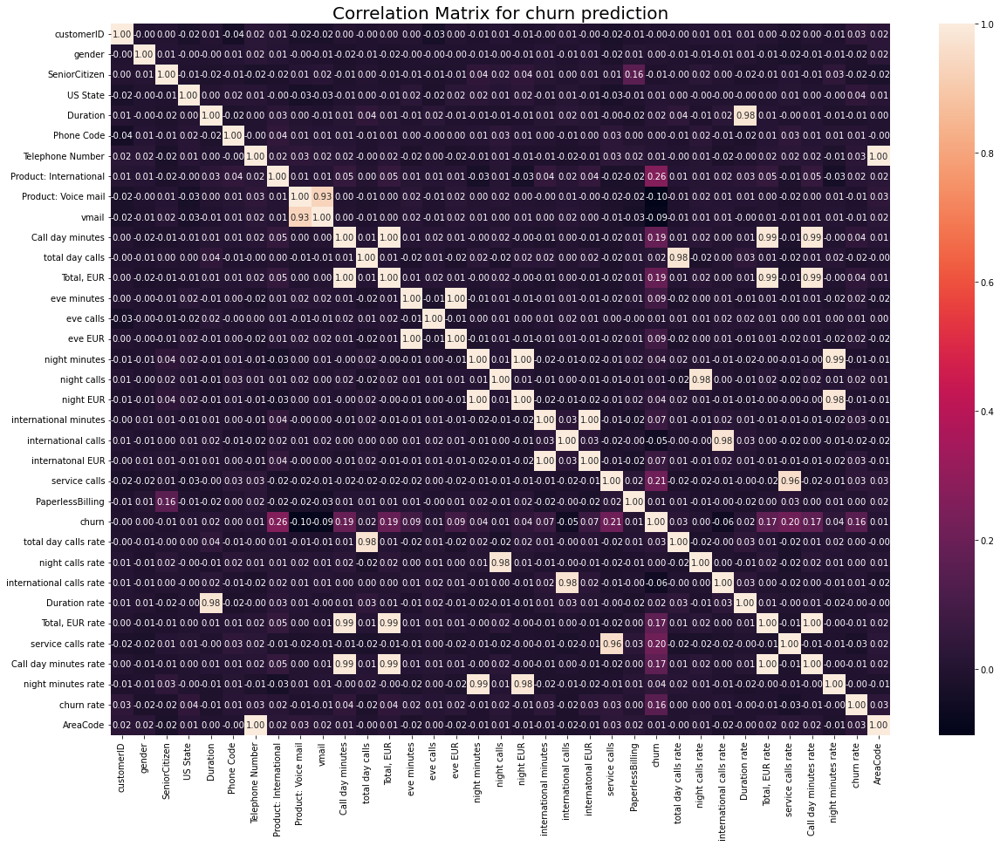

In [19]:
# Correlation matrix graph of the data set
f, ax = plt.subplots(figsize= [20,15])
sns.heatmap(df.corr(), annot=True, fmt=".2f", ax=ax)
ax.set_title("Correlation Matrix for churn prediction", fontsize=20)
plt.show()

<AxesSubplot:>

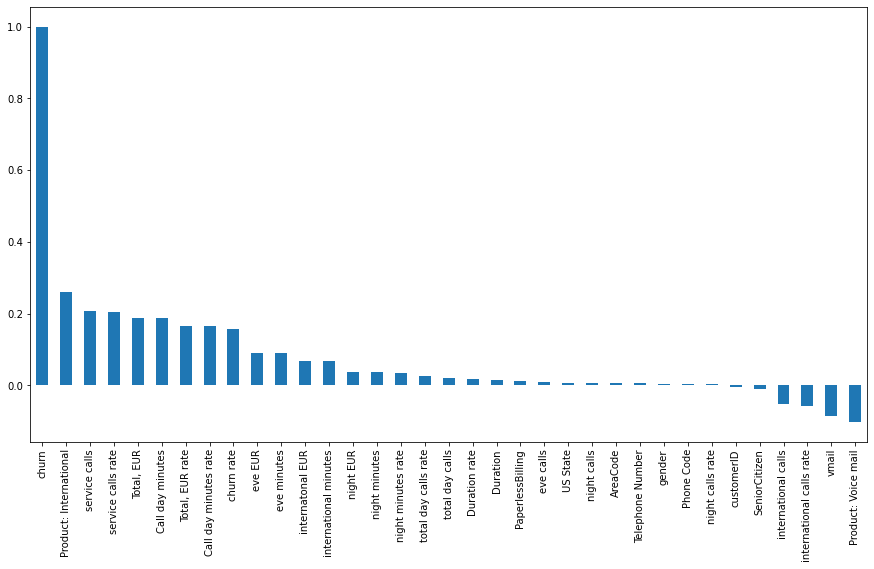

In [20]:
# calculates the correlation of churn with other features:
plt.figure(figsize=(15,8))
df.corr()['churn'].sort_values(ascending = False).plot(kind='bar')

In [65]:

X = df.loc[:, ((df.columns != 'churn') & (df.columns != 'customerID'))]

#for normalizing the range data that has a wide ranging set of independent variables-
churn_scaler = MinMaxScaler()
churn_scaler.fit(X)
X=churn_scaler.transform(X)
X=pd.DataFrame(X, columns = df.loc[:, ((df.columns != 'churn') & (df.columns != 'customerID'))].columns)
y = df['churn']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12)

# 5. Select a model, justify your choice, build a model to predict churn. (Auto ML shall not be used) 

In [23]:

# ML models

# Churn prediction here is treated it as a classification problem, classifying a customer as yes/no for churning.


# Logistic Regression: 
# -easy to explain and implement
# -with only thousands of data points, there may not be enough data to get very good results

# Random Forest:
#-can yield good results with less data, so it’s one of the best classification models for churn prediction
#-since we use grid-search method and the feature size is not so big, feature selection isn’t necessary.
#-It will automatically select the best features at each node of ensemble trees anyways.
#-to select the best hyperparameters, a 5 fold cross validation is used 
# searching across 200 different combinations


# XGBoost:
#-good option for mid-size datasets
#-To select the best hyperparameters, a 5-Fold Cross Validation with bayesian search is used.

Text(0.5, 0, 'Random Forest Feature Importance')

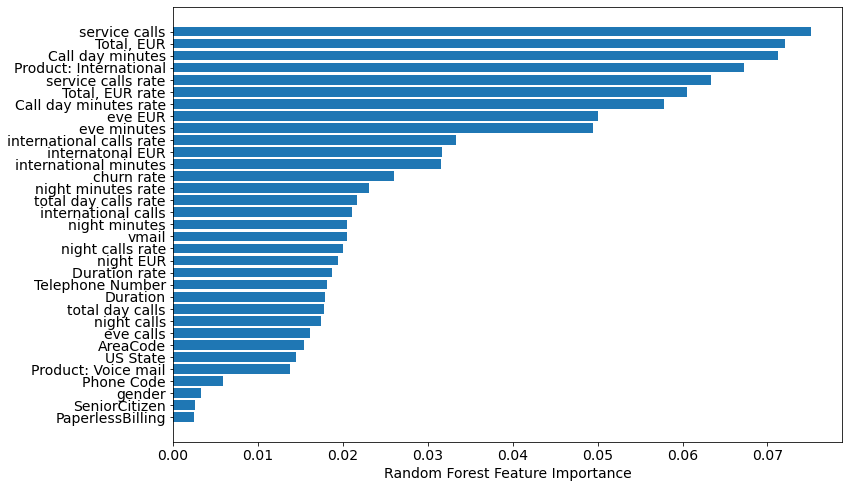

In [69]:
# Random Forest:

# Feature importance in Random Forest 
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})


rf = RandomForestClassifier(n_estimators=100, oob_score = True)
rf.fit(X_train, y_train)
sorted_idx = rf.feature_importances_.argsort()
plt.barh(X_train.columns[sorted_idx], rf.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

In [28]:
# Finding best hyperparameters wule applying cross validation
# RandomizedSearchCV randomly passes the set of hyperparameters and calculate the score and gives the best set of hyperparameters which gives the best score as an output.

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(random_state = 42)
# Random search of parameters, using 5 fold cross validation, 
# search across 200 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 200, scoring='precision', 
                              cv = 5, verbose=2, random_state=42, n_jobs=-1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(X_train, y_train)
rf_random.best_score_

# accuracy
print('accuracy best score:')
print(rf_random.best_score_)
print('best model parameters:')
print(rf_random.best_params_)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
accuracy best score:
0.9385597550768688
best model parameters:
{'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 100, 'bootstrap': True}


              precision    recall  f1-score   support

           0       0.95      0.99      0.97       708
           1       0.93      0.68      0.79       126

    accuracy                           0.94       834
   macro avg       0.94      0.84      0.88       834
weighted avg       0.94      0.94      0.94       834



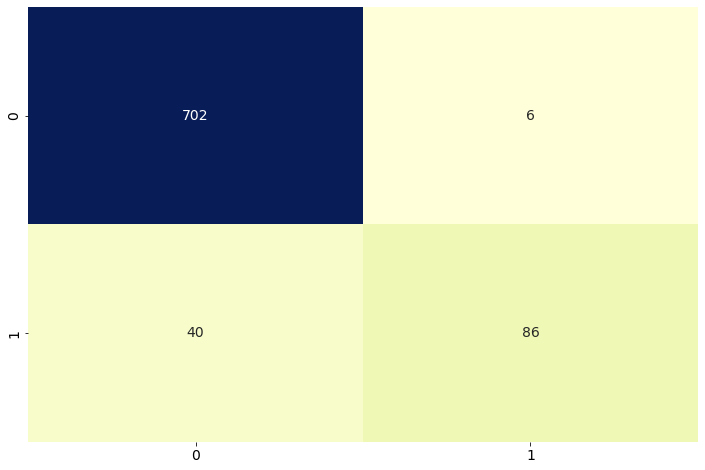

In [51]:
# model performace after finding the best model
best_random = rf_random.best_estimator_
best_random.fit(X_train, y_train)
predictions_score = best_random.predict_proba(X_test)[:,1]
predictions= best_random.predict(X_test)

CM = confusion_matrix(y_test.to_numpy(), predictions)#,labels=[0,1]
print(classification_report(y_test.to_numpy(), predictions))
# Visualize it as a heatmap
sns.heatmap(CM, fmt = 'd' , cmap="YlGnBu", cbar = False,  annot=True)
plt.show()

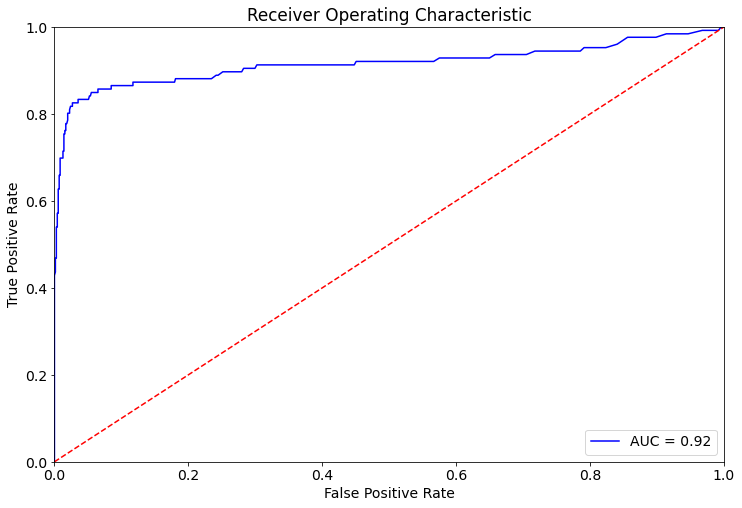

In [52]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(y_test, predictions_score)
roc_auc = metrics.auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#High TPR/Recall is achieved while maintaining a low FPR. Depending on our tolerance for False Positives, we can increase our TPR as well by shifting the threshold.


In [30]:
# XGBoost:
# Finding best XGB model Model with random grid search

In [32]:
#findng best hyperparameters

plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})


model = XGBClassifier()

param_grid = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
}

gs = GridSearchCV(
    estimator=model,
    param_grid=param_grid, 
    cv=5, 
    n_jobs=-1, 
    scoring='precision',
    verbose=2
)
xgb_grid = gs.fit(X_train, y_train)
    
# accuracy
print('best score:')
print(xgb_grid.best_score_)
print('best model parameters:')
print(xgb_grid.best_params_)

Fitting 5 folds for each of 405 candidates, totalling 2025 fits
best score:
0.944438682496276
best model parameters:
{'colsample_bytree': 0.8, 'gamma': 5, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 1.0}


              precision    recall  f1-score   support

           0       0.95      0.99      0.97       708
           1       0.90      0.71      0.80       126

    accuracy                           0.94       834
   macro avg       0.93      0.85      0.88       834
weighted avg       0.94      0.94      0.94       834



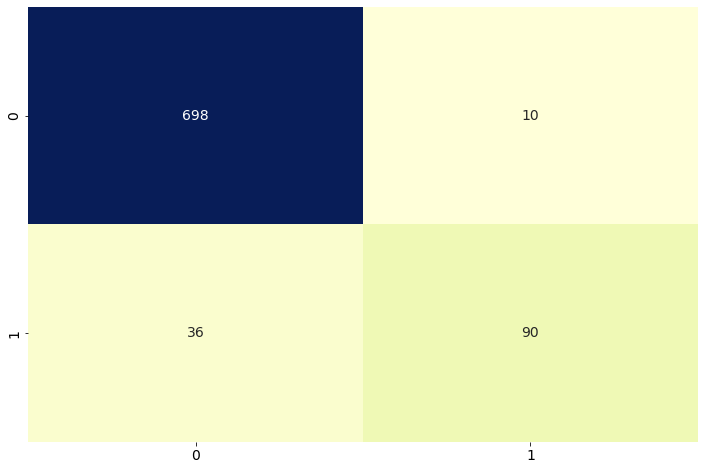

In [74]:
best_XGB = xgb_grid.best_estimator_
best_XGB.fit(X_train, y_train)
predictions_score = best_XGB.predict_proba(X_test)[:,1]
base_predictions = best_XGB.predict(X_test)

CM = confusion_matrix(y_test.to_numpy(), base_predictions)
print(classification_report(y_test.to_numpy(), base_predictions))
# Visualize it as a heatmap
sns.heatmap(CM, fmt = 'd' , cmap="YlGnBu", cbar = False,  annot=True)
plt.show()

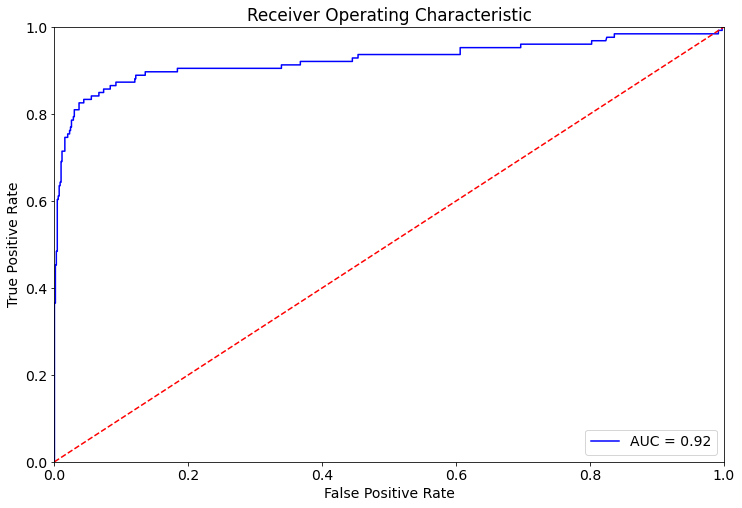

In [75]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(y_test, predictions_score)
roc_auc = metrics.auc(fpr, tpr)
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

##High TPR/Recall is achieved while maintaining a low FPR. Depending on our tolerance for False Positives, we can increase our TPR as well by shifting the threshold.


C:\Users\ElHarameinSamyJaby\Anaconda3\lib\site-packages\xgboost\core.py:90: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



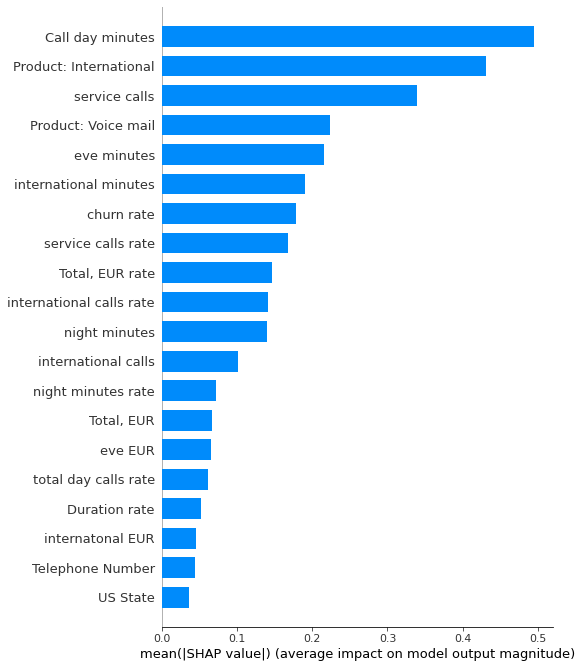

In [68]:
# features mean impact on XGBoost model output
shap_values = shap.TreeExplainer(best_XGB).shap_values(X_train)
shap.summary_plot(shap_values, X_train.columns, plot_type="bar")

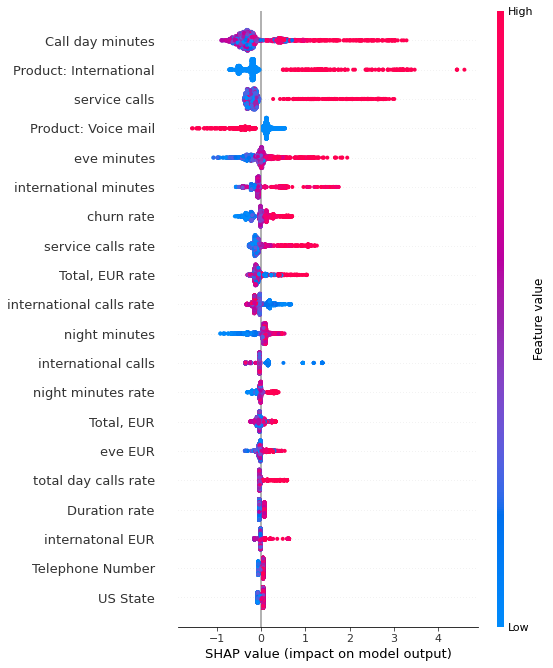

In [67]:
# features VALUE impact on XGBoost model output
#Product International high value (True) has the biggest impact on model output.
#The same goes for service call, eve minutes and churn rate.
#Product voice call low values (False) has the biggest impact on model output.
#Total, EUR feature in XGBoost has less impact on the model and random forest.

shap.summary_plot(shap_values, X_train)

# 6. Explain your model results, explain which features are important, which are not. Were your assumptions correct? If not, why do you think that is the case? 

In [ ]:
#Random Forest:
#Accuracy best score: 0.93

#XGBoost:
#Accuracy best score: 0.94

#The focus for the Random search is to find the best parameters to maximize precision average.

#Confusion matrix for our Test predictions shows the values as follows:
#Predicted not to churn and not churned TN    |  Predicted not Churned but churned FP
#Predicted to churn and not churned FN          | Predicted to churn and churned TP
#The main focus should be on minimizing false positive and false negative, this can be done by optimizing the precision and recall.
#For our demonstration I focused on optimizing the precision.


#XGBoost showed slightly better score and false negative, which is our focus to minimize the number of users which we predict as positive which eventually won’t churn.



#Some of the assumptions were correct regarding the features, since service call, total EUR, produce: international were the most important features for RF.




# 7. How would you test the model results? What is the best practice?

In [36]:
#there are differnt types of testing which can be considered 

#-Cross-validation while training the model: for this scenario 5 fold cross validation is used to test the trained model

#-Automated tests for model verification: by applying smoke test, unit tests and finally integration tests
# unit tests and integration tests help to prevent low-quality data from entering the training pipeline.
#-Manual model evaluation and validation: done by domain expert generated and reviewed a model quality report

# 8. Present the results (showcase the model, explain each step, if needed support your presentation with power point slides) and insights that you managed to extract out of the data. 

In [72]:
#.ppt attached

# 9. What if you had an access to Azure synapse workspace, how would you approach the task? How would you automate the model run?

In [73]:
#The following steps will be taken in case i have access to Azure synapse:

#-Open Azure machine learning workspace lined service in synapse
#-Open Azure new notebook for EDA and preprocessing
#-Access to the churn data maybe in sql in synapse workspace
#-Make the EDA and preprocessing using synapse workspace
#-Train and test the needed models in the created notebook, each model in a separate file, analyse the results 
#-Use one of ml model interpretation tools to share the results, ex. SHAP, Mimic 

#The following steps will be taken to automate the model run:
#-Set a threshold for the new model score generated, for example 0.85
#-The threshold will guarantee the quality of the regularly trained model
#-The score here is either precision or recall in case of churn
#-Add the init function to deploy the model
#-Add the run function to predict unseen new data
#-Use SHAP to explain and monitor the model performace 